In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('../src')

In [3]:
import anndata
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import seaborn as sns
import torch
import pandas as pd

from spaceoracle.models.estimators import ViTEstimatorV2, device, PixelAttention
import spaceoracle
from spaceoracle import SpaceOracle

In [4]:
# from utils import adata_train, adata_test

In [5]:
adata_train = sc.read_h5ad('./.cache/adata_train.h5ad')
adata_test = sc.read_h5ad('./.cache/adata_test.h5ad')

In [307]:
import json

with open('../data/celltype_assign.json', 'r') as f:
    celltype_assign = json.load(f)

adata_train.obs['rctd_celltypes'] = adata_train.obs['rctd_cluster'].astype(str).map(celltype_assign)
adata_test.obs['rctd_celltypes'] = adata_test.obs['rctd_cluster'].astype(str).map(celltype_assign)

In [7]:
def clean_up_adata(adata):
    fields_to_keep = ['cluster', 'rctd_cluster', 'rctd_celltypes']
    current_obs_fields = adata.obs.columns.tolist()
    excess_obs_fields = [field for field in current_obs_fields if field not in fields_to_keep]
    for field in excess_obs_fields:
        del adata.obs[field]
    
    current_var_fields = adata.var.columns.tolist()
    excess_var_fields = [field for field in current_var_fields 
        if field not in []]
    for field in excess_var_fields:
        del adata.var[field]

    del adata.uns

In [8]:
clean_up_adata(adata_train)
clean_up_adata(adata_test)

In [9]:
# sc.pl.embedding(
#     adata_train, color=target_gene, basis='spatial', 
#     layer='normalized_count', cmap='viridis')

# sc.pl.embedding(
# adata_train, color=target_gene, basis='spatial', 
# layer='imputed_count', cmap='viridis')

In [10]:
# estimator2 = ViTEstimatorV2(adata_train, target_gene=target_gene, layer='imputed_count')

# estimator2.fit(
#     annot='rctd_cluster', 
#     max_epochs=10, 
#     learning_rate=3e-4, 
#     spatial_dim=64,
#     batch_size=128,
#     init_betas='co',
#     mode='train_test',
#     rotate_maps=True,
#     cluster_grn=True,
#     regularize=False,
#     n_patches=4, n_heads=2, n_blocks=4, hidden_d=16
# )

In [11]:
target_gene = 'Cd74'
target_gene in adata_train.var_names

True

In [12]:
SpaceOracle.imbue_adata_with_space(adata_train, annot='rctd_cluster', spatial_dim=64, in_place=True)

🌍️ Generating 64x64 spatial maps: 100%|██████████| 9043/9043 [00:12<00:00, 696.98it/s]


In [272]:
estimator = PixelAttention(
    adata_train, target_gene=target_gene, layer='imputed_count')

estimator.fit(
    annot='rctd_cluster', 
    max_epochs=15, 
    learning_rate=7e-4, 
    spatial_dim=64,
    batch_size=256,
    init_betas='zeros',
    mode='train_test',
    rotate_maps=True,
    cluster_grn=True,
    regularize=True,
)

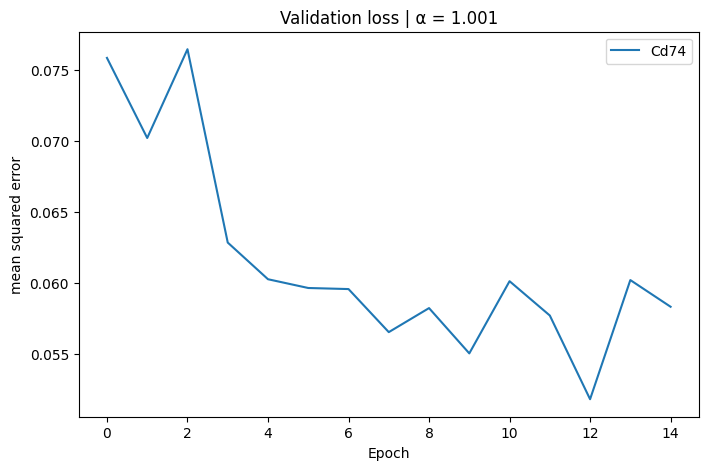

In [274]:
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams['figure.dpi'] = 100
plt.plot(estimator.losses, label=target_gene)
plt.xlabel('Epoch')
plt.ylabel('mean squared error')
plt.title(f'Validation loss | α = {estimator.model.alpha.item():.3f}')
plt.legend()
plt.show()

In [370]:
est = estimator
with torch.no_grad():
    betas = est.get_betas(
        spatial_maps=np.array(adata_train.obsm['spatial_maps']),
        labels=np.array(adata_train.obs['rctd_cluster']),
    )
    
    y_pred = est.predict_y(
        est.model, 
        torch.from_numpy(betas).to(device), 
        torch.from_numpy(
            adata_train.to_df(layer=est.layer)
            [est.regulators].values.astype(np.float32)).to(device)).cpu().numpy()

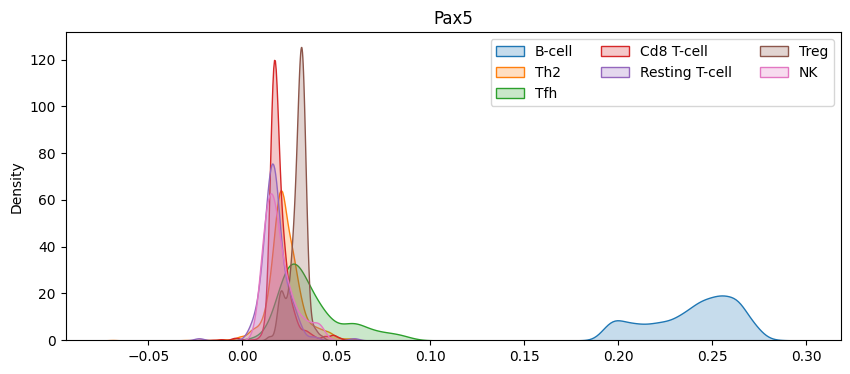

In [276]:
plt.rcParams['figure.figsize'] = [10, 4]
df = pd.DataFrame(betas, columns=['intercept']+est.regulators)

for celltype in adata_train.obs['rctd_celltypes'].unique():
    sns.kdeplot(
        df['Pax5'].values[adata_train.obs['rctd_celltypes'] == celltype], 
        shade=True, label=celltype)
plt.title('Pax5')
plt.legend(ncols=3)
plt.show()

In [311]:
import umap
from tqdm import tqdm

# Extract the routing function outputs for each item in adata_train
routing_outputs = []
with torch.no_grad():
    for spatial_map, label in tqdm(zip(adata_train.obsm['spatial_maps'], adata_train.obs['rctd_cluster']), total=len(adata_train)):
        spatial_map_tensor = torch.from_numpy(spatial_map).unsqueeze(0).to(device)
        label_tensor = torch.tensor(label).to(device)
        pooled_inputs = est.model.conditional_conv._avg_pooling(spatial_map_tensor)
        routing_output = est.model.conditional_conv._routing_fn(pooled_inputs, label_tensor)
        routing_outputs.append(routing_output.cpu().numpy())

routing_outputs = np.array(routing_outputs).squeeze()


100%|██████████| 9043/9043 [00:05<00:00, 1662.53it/s]


In [341]:
umap_reducer = umap.UMAP(n_neighbors=200, min_dist=0.45)
embedding = umap_reducer.fit_transform(routing_outputs)

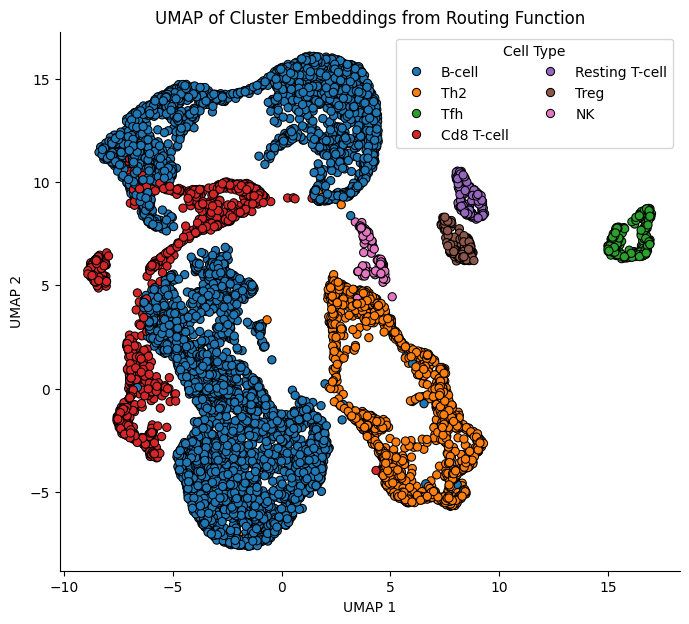

In [369]:
plt.rcParams['figure.figsize'] = [8, 7]
plt.rcParams['figure.dpi'] = 100

sns.scatterplot(
    x=embedding[:, 0], y=embedding[:, 1], 
    s=35, hue=adata_train.obs['rctd_celltypes'], palette='tab10', 
    edgecolor='black', linewidth=0.75)
plt.title('UMAP of Cluster Embeddings from Routing Function')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend(title='Cell Type', ncols=2)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

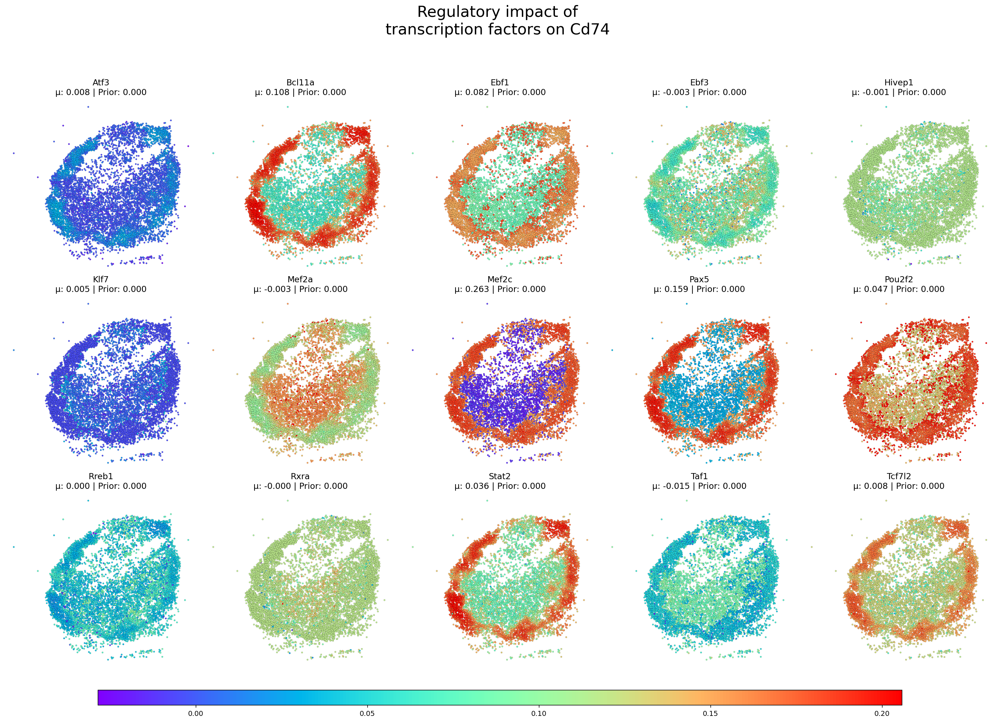

In [277]:
f, axs = plt.subplots(3, 5, figsize=(20, 15), dpi=140, sharex=True, sharey=True)
axs = axs.flatten()

scatter_plots = []

for i in range(len(axs)): 
    axs[i].set_facecolor('white')
    scatter = sns.scatterplot(x=adata_train.obsm['spatial'][:, 0], y=adata_train.obsm['spatial'][:, 1], 
                s=5, c=betas[:, i+1], cmap='rainbow', 
                ax=axs[i], edgecolor='black', linewidth=0.1, 
    )
    scatter_plots.append(scatter)

beta_means = list(betas.mean(0))
for ix, ax in enumerate(axs):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_title(f'{est.regulators[ix]}\n'
        f'μ: {beta_means[ix+1]:.3f} | Prior: {est.model.betas[1:][ix]:.3f}')
    ax.set_xticks([])
    ax.set_yticks([])
    
    
plt.tight_layout()
f.subplots_adjust(bottom=0.1)

# Add a colorbar
cbar_ax = f.add_axes([0.1, 0.05, 0.8, 0.02])
colorbar = f.colorbar(
    scatter_plots[0].collections[0], cax=cbar_ax, orientation='horizontal')


plt.suptitle(f'Regulatory impact of \ntranscription factors on {est.target_gene} ', fontsize=22)
plt.subplots_adjust(top=0.855)
plt.show()

In [256]:
pd.DataFrame(est.model.betas[1:], index=est.regulators, columns=['ols']).T

,Atf3,Bcl11a,Ebf1,Ebf3,Hivep1,Klf7,Mef2a,Mef2c,Pax5,Pou2f2,Rreb1,Rxra,Stat2,Taf1,Tcf7l2
ols,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


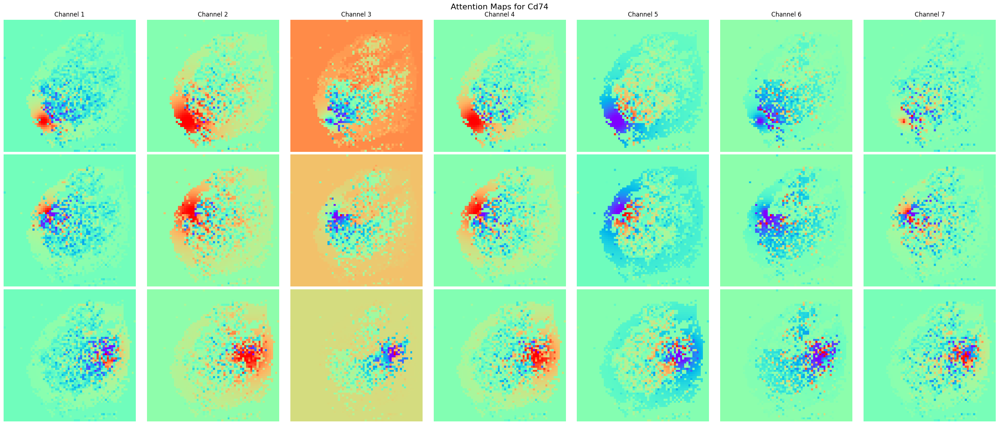

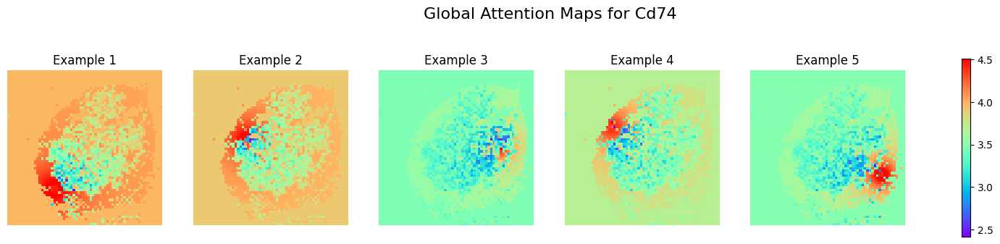

In [278]:
# Assuming the model is stored in est.model
model = estimator.model
model.eval()
# Get a batch of spatial maps and cluster info
spatial_maps = torch.from_numpy(adata_train.obsm['spatial_maps'][:5]).float()  # Take first 5 samples
cluster_info = torch.from_numpy(adata_train.obs['rctd_cluster'].cat.codes.values[:5]).long()

# Move tensors to the same device as the model
device = next(model.parameters()).device
spatial_maps = spatial_maps.to(device)
cluster_info = cluster_info.to(device)

# Get the attention maps
with torch.no_grad():
    att = model.sigmoid(model.conditional_conv(spatial_maps, cluster_info))

# Move attention maps back to CPU for plotting
att = att.cpu().numpy()

# Plot 3 examples of attention maps
n_examples = 3
n_channels = att.shape[1]

fig, axes = plt.subplots(n_examples, n_channels, figsize=(4*n_channels, 4*n_examples))
fig.suptitle(f'Attention Maps for {target_gene}', fontsize=16)

for i in range(n_examples):
    for j in range(n_channels):
        im = axes[i, j].imshow(att[i, j], cmap='rainbow')
        axes[i, j].axis('off')
        if i == 0:
            axes[i, j].set_title(f'Channel {j+1}')
    axes[i, 0].set_ylabel(f'Example {i+1}', rotation=0, ha='right', va='center')

# fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.8)


plt.tight_layout()
plt.show()

# Calculate the mean attention across channels
mean_att = att.sum(1)

# Plot the mean attention maps
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
fig.suptitle(f'Global Attention Maps for {target_gene}', fontsize=16)

for i in range(5):
    im = axes[i].imshow(mean_att[i], cmap='rainbow')
    axes[i].axis('off')
    axes[i].set_title(f'Example {i+1}')

plt.colorbar(im, ax=axes.ravel().tolist(), shrink=0.8)
# plt.tight_layout()
plt.show()


In [280]:
from scipy.ndimage import gaussian_filter

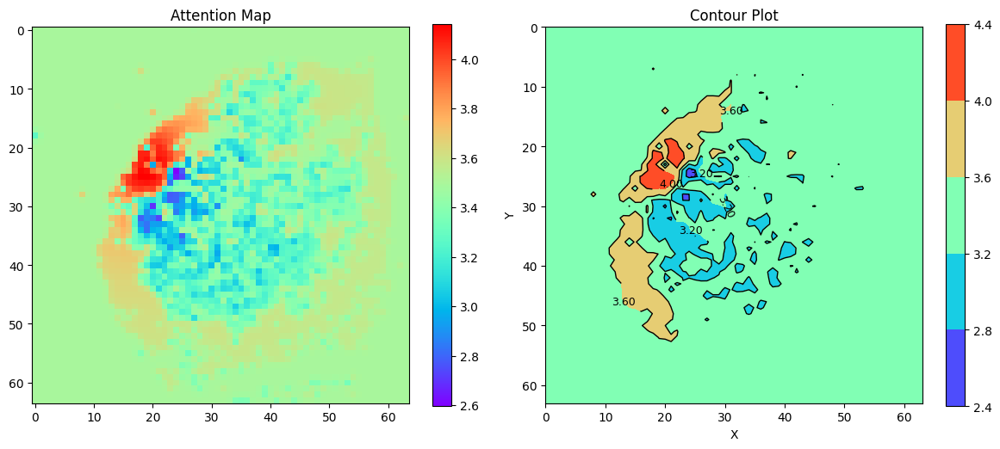

In [290]:
sample_id = 3
atx = att.sum(1)[sample_id]

atx = gaussian_filter(atx, sigma=0.5)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

levels = 4

# Image plot
im1 = ax1.imshow(atx, cmap='rainbow')
ax1.set_title('Attention Map')
fig.colorbar(im1, ax=ax1)

# Contour plot
x = np.arange(0, atx.shape[1])
y = np.arange(0, atx.shape[0])
X, Y = np.meshgrid(x, y)
im2 = ax2.contourf(Y, X, atx.T, cmap='rainbow', levels=levels)  # Transpose att and swap X, Y
contour = ax2.contour(Y, X, atx.T, levels=levels, colors='black', linewidths=1)  # Add black lines around contours
ax2.set_title('Contour Plot')
fig.colorbar(im2, ax=ax2)

# Add labels to the contour plot
ax2.set_xlabel('X')
ax2.set_ylabel('Y')

# Add contour labels with black color and rotate to align with contour lines
ax2.clabel(contour, inline=True, fontsize=9, colors='black', fmt='%1.2f', use_clabeltext=True)
for l in contour.labelTexts:
    l.set_rotation_mode('anchor')
    l.set_rotation(0)  # This will be adjusted in the loop below

# Adjust label rotation to align with contour lines
for i, line in enumerate(contour.collections):
    for j, path in enumerate(line.get_paths()):
        vertices = path.vertices
        x = vertices[:, 0]
        y = vertices[:, 1]
        # Calculate the angle of the contour line
        angle = np.rad2deg(np.arctan2(y[-1] - y[0], x[-1] - x[0]))
        # Adjust the rotation of the corresponding label
        if i < len(contour.labelTexts):
            contour.labelTexts[i].set_rotation(angle)

ax2.set_aspect('equal')
ax2.invert_yaxis()  # Invert y-axis to match image orientation

plt.tight_layout()
plt.show()

In [294]:
from scipy.stats import spearmanr, pearsonr
from sklearn.metrics import r2_score

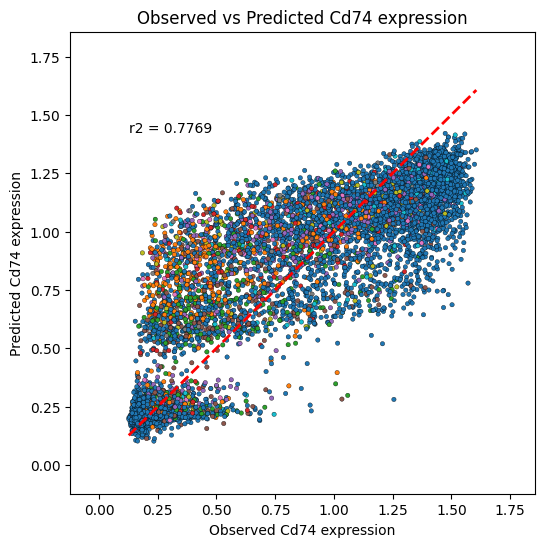

In [372]:
plt.rcParams["figure.figsize"] = (6, 6)
plt.rcParams['figure.dpi'] = 100

y = adata_train.to_df(layer=est.layer)[[target_gene]]

sns.scatterplot(
    x=y.values.reshape(-1), 
    y=y_pred.reshape(-1), s=10, 
    c=adata_train.obs.cluster.values[:], cmap='tab10', edgecolor='black', linewidth=0.25)

plt.xlim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
plt.ylim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
# Add x=y line
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)

plt.xlabel(f'Observed {target_gene} expression')
plt.ylabel(f'Predicted {target_gene} expression')
plt.title(f'Observed vs Predicted {target_gene} expression')
r2 = r2_score(y.values.reshape(-1), y_pred.reshape(-1))
plt.text(
    x=y.values.min(), 
    y=y_pred.max()+0.05, 
    s=f'r2 = {r2:.4f}', 
    fontsize=10, 
    fontname='DejaVu Sans',
    ha='left',
    va='top'
)
plt.show()

In [259]:
# SpaceOracle.imbue_adata_with_space(adata_test, annot='rctd_cluster', spatial_dim=64, in_place=True)

In [373]:
with torch.no_grad():
    betas_test = est.get_betas(
        spatial_maps=np.array(adata_test.obsm['spatial_maps']),
        labels=np.array(adata_test.obs['rctd_cluster']),
    )
    
    y_pred_test = est.predict_y(
        est.model, 
        torch.from_numpy(betas_test).to(device), 
        torch.from_numpy(
            adata_test.to_df(est.layer)
            [est.regulators].values.astype(np.float32)).to(device)).cpu().numpy()

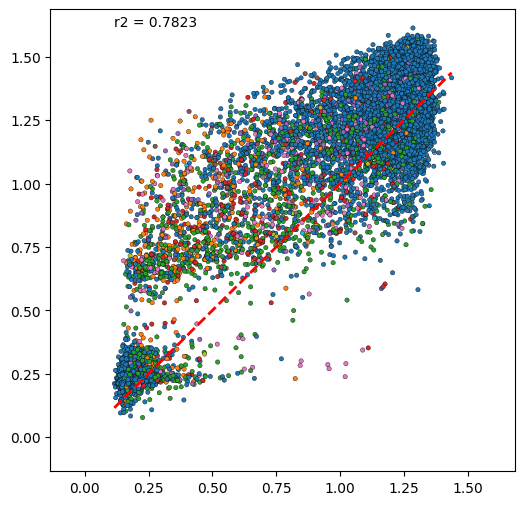

In [376]:
plt.rcParams["figure.figsize"] = (6, 6)
plt.rcParams['figure.dpi'] = 100
y = adata_test.to_df(layer=est.layer)[[target_gene]]
sns.scatterplot(
    x=y.values.reshape(-1), 
    y=y_pred_test.reshape(-1), s=10, 
    c=adata_test.obs.cluster.values[:], cmap='tab10', edgecolor='black', linewidth=0.25)
plt.xlim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
plt.ylim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)

r2 = r2_score(y.values.reshape(-1), y_pred_test.reshape(-1))
plt.text(
    x=y.values.min(), 
    y=y_pred_test.max()+0.05, 
    s=f'r2 = {r2:.4f}', 
    fontsize=10, 
    fontname='DejaVu Sans',
    ha='left',
    va='top'
)
plt.xlim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
plt.ylim(y.values[:, :].min()-0.25, y.values[:, :].max()+0.25)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)
plt.show()


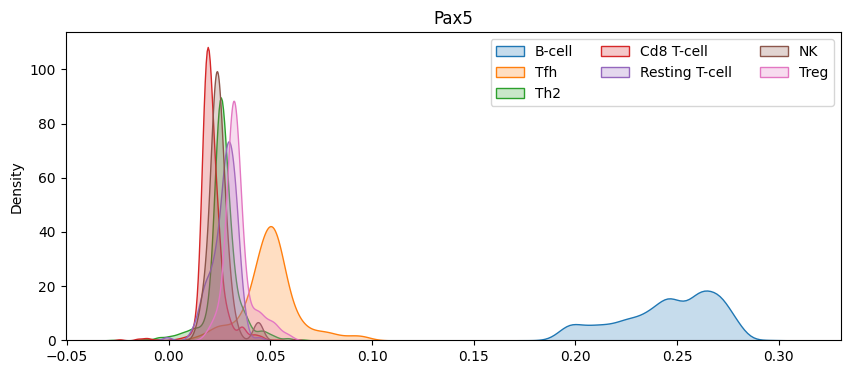

In [308]:
plt.rcParams['figure.figsize'] = [10, 4]
df = pd.DataFrame(betas_test, columns=['intercept']+est.regulators)

for celltype in adata_test.obs['rctd_celltypes'].unique():
    sns.kdeplot(
        df['Pax5'].values[adata_test.obs['rctd_celltypes'] == celltype], 
        shade=True, label=celltype)

plt.title('Pax5')
plt.legend(ncols=3)
plt.show()

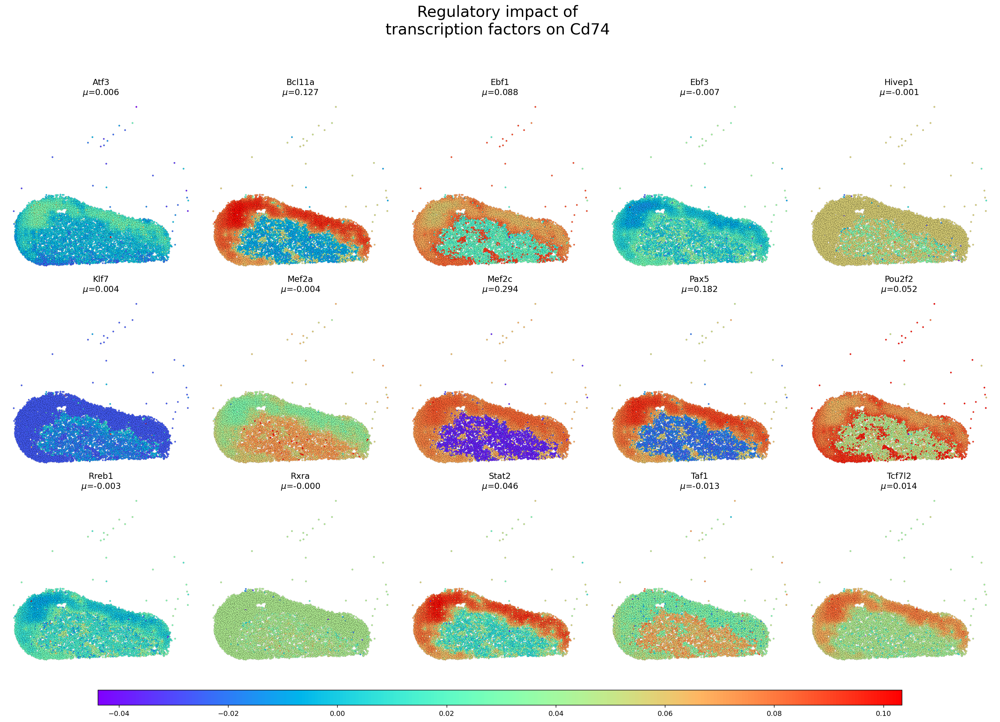

In [298]:
f, axs = plt.subplots(3, 5, figsize=(20, 15), dpi=140, sharex=True, sharey=True)
axs = axs.flatten()

scatter_plots = []

for i in range(len(axs)): 
    axs[i].set_facecolor('white')
    scatter = sns.scatterplot(x=adata_test.obsm['spatial'][:, 0], y=adata_test.obsm['spatial'][:, 1], 
                s=5, c=betas_test[:, i+1], cmap='rainbow', 
                ax=axs[i], edgecolor='black', linewidth=0.1, 
    )
    scatter_plots.append(scatter)

beta_means = list(betas_test.mean(0))
for ix, ax in enumerate(axs):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_title(f'{est.regulators[ix]}\n'+ r'$\mu$' + f'={beta_means[ix+1]:.3f}')
    ax.set_xticks([])
    ax.set_yticks([])
    
    
plt.tight_layout()
f.subplots_adjust(bottom=0.1)

# Add a colorbar
cbar_ax = f.add_axes([0.1, 0.05, 0.8, 0.02])
colorbar = f.colorbar(
    scatter_plots[0].collections[0], cax=cbar_ax, orientation='horizontal')


plt.suptitle(f'Regulatory impact of \ntranscription factors on {est.target_gene} ', fontsize=22)
plt.subplots_adjust(top=0.855)
plt.show()

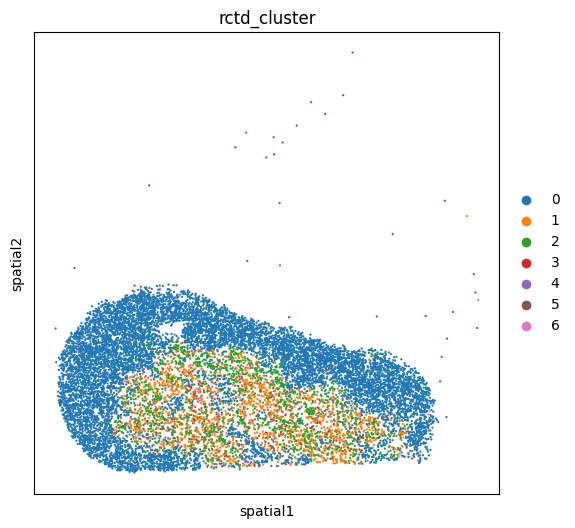

In [52]:
sc.pl.embedding(adata_test, color='rctd_cluster', basis='spatial', layer='imputed_count', cmap='viridis')

In [231]:
adata_x = sc.read_h5ad('../data/slideseq/day3_1.h5ad')
adata_x

AnnData object with n_obs × n_vars = 15920 × 24649
    obs: 'cluster', 'rctd_cluster'
    uns: 'cluster_colors', 'rctd_cluster_colors'
    obsm: 'X_spatial', 'rctd_results', 'spatial'

In [256]:
[gene for gene in adata_x.var_names if 'Prdm' in gene]

['Prdm1',
 'Prdm10',
 'Prdm11',
 'Prdm15',
 'Prdm16',
 'Prdm2',
 'Prdm4',
 'Prdm5',
 'Prdm8',
 'Prdm9']

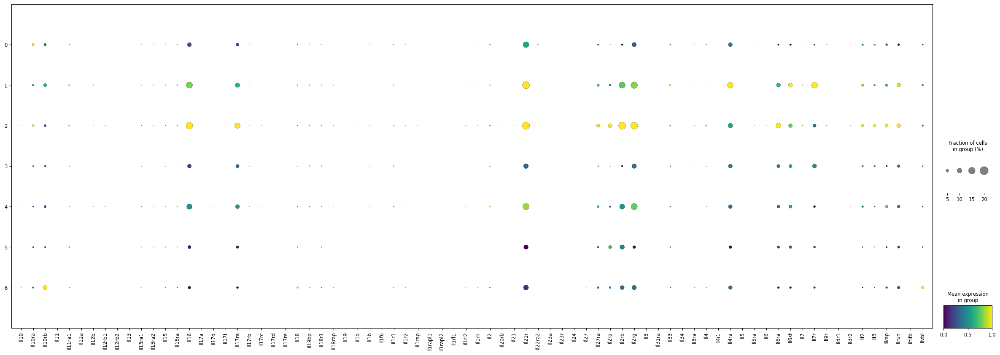

In [249]:
genes_of_interest = sorted([gene for gene in adata_x.var_names if 'Il' in gene])
sc.pl.dotplot(
    adata_x, 
    var_names=genes_of_interest, 
    groupby='rctd_cluster', 
    cmap='viridis', 
    standard_scale='var', 
    color_map='viridis',
    figsize=(30, 10),
)


In [273]:

n_top_genes = 10000
min_cells = 10
min_counts = 350
spatial_dim = 64

adata_x = anndata.read_h5ad('../data/slideseq/day3_1.h5ad')

adata_x.var_names_make_unique()
adata_x.var["mt"] = adata_x.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata_x, qc_vars=["mt"], inplace=True)
sc.pp.filter_cells(adata_x, min_counts=min_counts)
adata_x = adata_x[adata_x.obs["pct_counts_mt"] < 20].copy()
adata_x = adata_x[:, ~adata_x.var["mt"]]
sc.pp.filter_genes(adata_x, min_cells=min_cells)

adata_x.layers["raw_count"] = adata_x.X

sc.pp.normalize_total(adata_x, inplace=True)
sc.pp.log1p(adata_x)
sc.pp.highly_variable_genes(
    adata_x, flavor="seurat", n_top_genes=n_top_genes)

adata_x = adata_x[:, adata_x.var.highly_variable]

In [274]:
assert all(gene in adata_x.var_names for gene in ['Il2', 'Il4', 'Il12b', 'Prdm1'])

In [275]:
adata_x.layers['normalized_count'] = adata_x.X

In [276]:
%%time

from spaceoracle.oracles import SpaceOracle

pcs = SpaceOracle.perform_PCA(adata_x)
SpaceOracle.knn_imputation(adata_x, pcs)


CPU times: user 50min 53s, sys: 32.3 s, total: 51min 25s
Wall time: 6min 32s


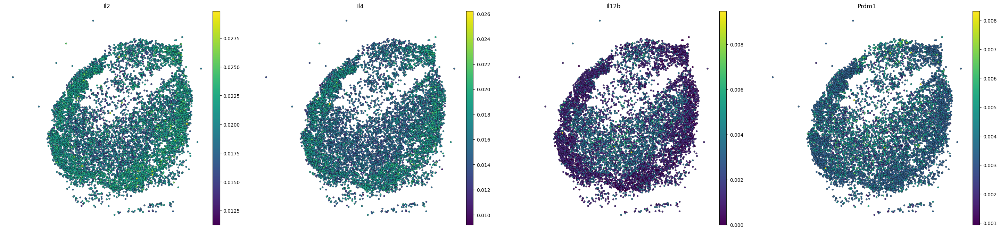

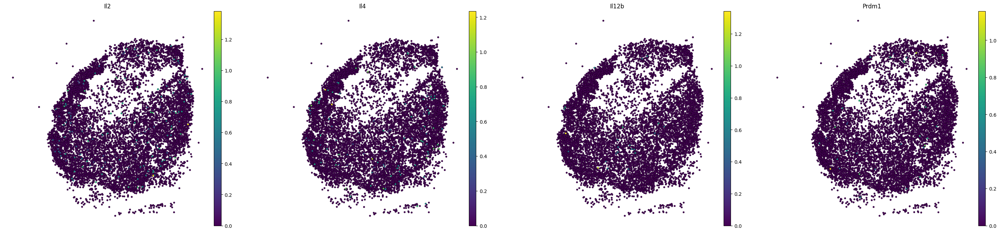

In [280]:
plt.rcParams['figure.figsize'] = [8, 8]
sc.pl.embedding(
    adata_x, 
    color=['Il2', 'Il4', 'Il12b', 'Prdm1'], 
    basis='spatial', 
    layer='imputed_count', 
    cmap='viridis',
    frameon=False,
    show=True,
    s=50, linewidth=0.25, edgecolor='black'
)

sc.pl.embedding(
    adata_x, 
    color=['Il2', 'Il4', 'Il12b', 'Prdm1'], 
    basis='spatial', 
    layer='normalized_count', 
    cmap='viridis',
    frameon=False,
    show=True,
    s=50, linewidth=0.25, edgecolor='black'
)